Colony1: 15 columns, 10 rows
Colony2: 12 columns, 8 rows
position
Colony1    150
Colony2     96
dtype: int64


c:\Users\Andy\anaconda3\envs\cellpose\Lib\site-packages\numpy\core\fromnumeric.py:57: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


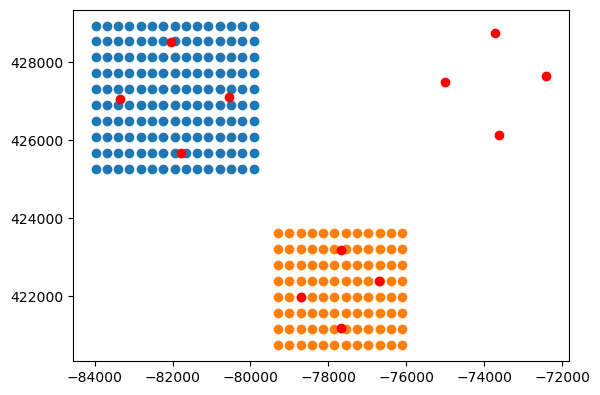

In [1]:
from monolayer_tracking.utils import create_mosaic_tiles

create_mosaic_tiles(r'H:\raw_data\20240331 FUCCI halo colonies\tilebounds.STG', use_colonies=[1,2], padding=800)

In [1]:
# 1.44 pixels/micron
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
from natsort import natsorted
from glob import glob
from monolayer_tracking.segmented_comprehension import Stack, Image
from scipy import ndimage
from scipy.stats import binned_statistic

plt.style.use('dark_background')

In [2]:
stack=Stack('F:/my_data/Segmentation/20240322 FUCCI halo sort1 col_glass colonies/segmented/')

In [3]:
stack.get_mitoses()

[                cell_number           y           x
 particle frame                                     
 1259     2             1425  931.079603  952.735620
 9337     3             1456  922.542234  947.448879
 9413     3             1520  940.559444  956.564848,
                 cell_number            y            x
 particle frame                                       
 6137     2             6925  2222.549449  1680.270464
 9624     3             7064  2217.790414  1687.628364
 9627     3             7105  2227.183490  1670.538195,
                 cell_number           y            x
 particle frame                                      
 166      3              197  505.679081  1434.655244
 9699     4              203  501.292407  1445.831880
 9700     4              220  506.418698  1425.976071,
                 cell_number            y           x
 particle frame                                      
 1968     3             2323  1132.230232  469.892040
 9812     4             2

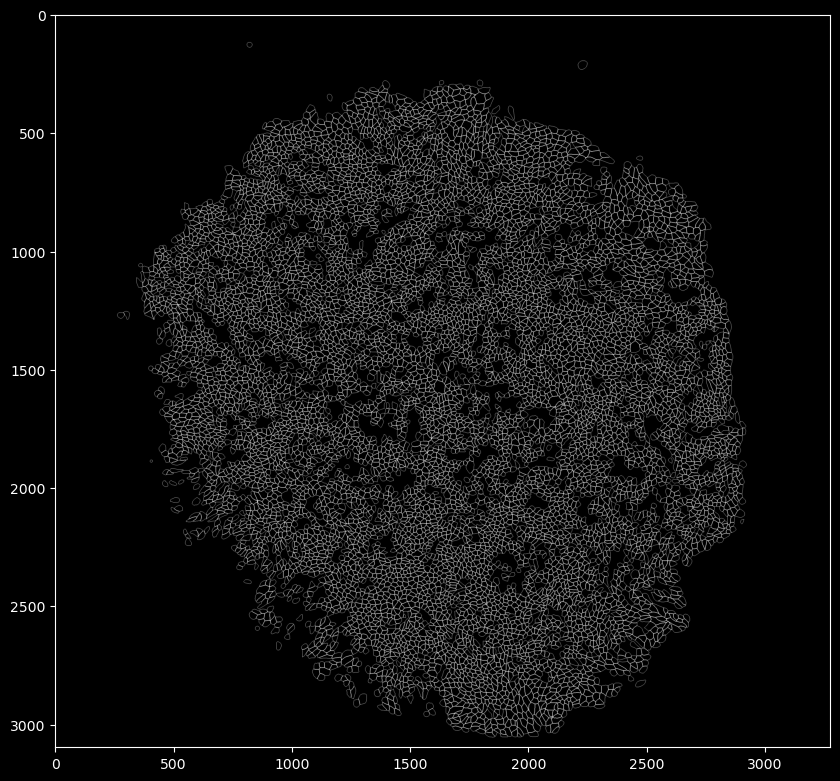

In [12]:
plt.figure(figsize=(10,10))
plt.imshow(stack.frames[-5].outlines.todense()!=0, cmap='gray')

In [5]:
from monolayer_tracking import plot_tools
plot_tools.highlight_mitoses(stack, show_labels=False, figsize=15)

  0%|          | 0/116 [00:00<?, ?it/s]

In [7]:
plot_tools.demo_seg(stack, figsize=10)

  0%|          | 0/116 [00:00<?, ?it/s]

# full colony

In [8]:
stack=Stack(r'F:\Heather\FUCCI\20240301 FUCCI colony\segmented/')

## find the center & colony radius

In [9]:
def get_colony_mask(masks, close_iter=40, open_iter=40):
    # get colony mask
    colony_mask=ndimage.binary_closing(masks!=0, iterations=close_iter)
    colony_mask=ndimage.binary_opening(colony_mask, iterations=open_iter)
    colony_mask=ndimage.binary_fill_holes(colony_mask)
    return colony_mask

def get_boundary(frame):
    colony_mask=get_colony_mask(frame.masks)
    # fit colony mask to a circle
    radius=np.sqrt(np.sum(colony_mask)/np.pi)
    # get center of colony mask
    center=ndimage.center_of_mass(colony_mask) # (y, x)

    return center, radius

In [10]:
centers=[]
radii=[]
for frame in tqdm(stack.frames):
    center, radius=get_boundary(frame)
    frame.center=center
    frame.radius=radius

  0%|          | 0/36 [00:00<?, ?it/s]

## polar coordinates

In [11]:
t=stack.get_velocities(filter_stubs=False).sort_values(['frame', 'cell_number'])

In [12]:
centroid_distances=[]
edge_distances=[]
thetas=[]
areas=[]
for frame_number, t_frame in tqdm(t.groupby('frame')):
    frame=stack.frames[frame_number]
    centroids=t_frame[['y', 'x']].values
    r=np.linalg.norm(centroids-frame.center, axis=1)

    thetas.append(np.arctan2(*(centroids-frame.center).T))
    centroid_distances.append(r)
    areas.append(frame.cell_areas())
    edge_distances.append(frame.radius-r)

t['colony_theta']=np.concatenate(thetas)
t['r']=np.concatenate(centroid_distances)
t['edge_distance']=np.concatenate(edge_distances)
t['area']=np.concatenate(areas)

# compute radial and tangential velocities
radial_vector=np.array([np.cos(t['colony_theta']), np.sin(t['colony_theta'])]).T
tangent_vector=np.array([-radial_vector[:, 1], radial_vector[:, 0]]).T

t['v_r']=(t[['dx','dy']]*radial_vector).sum(axis=1, min_count=1)
t['v_theta']=(t[['dx','dy']]*tangent_vector).sum(axis=1, min_count=1)

  0%|          | 0/36 [00:00<?, ?it/s]

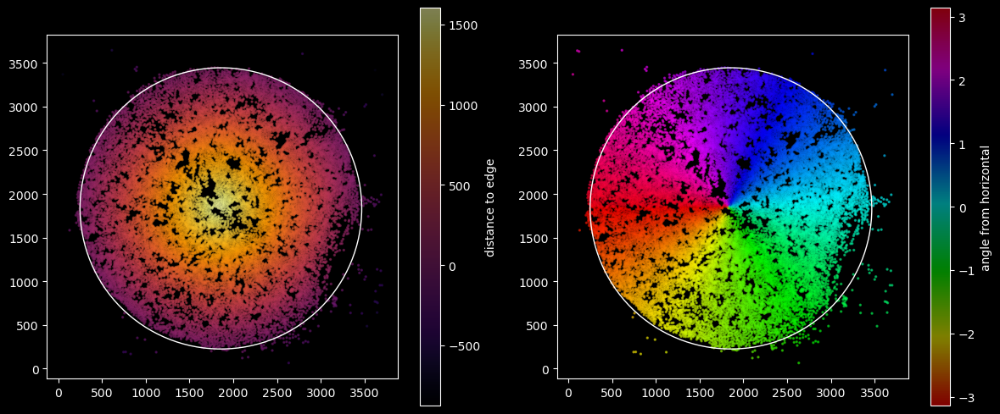

In [13]:
frame=stack.frames[0]
t_frame=t[t.frame==0]

fig, axes=plt.subplots(1, 2, figsize=(12, 5))
# edge distance
cbar=axes[0].scatter(t_frame['x'], t_frame['y'], cmap='inferno', c=t_frame['edge_distance'], s=2, alpha=0.5)
axes[0].add_artist(plt.Circle(frame.center, frame.radius, fill=False, color='w'))
axes[0].set_aspect('equal')
plt.colorbar(cbar, label='distance to edge')

# colony theta
cbar=axes[1].scatter(t_frame['x'], t_frame['y'], cmap='hsv', c=t_frame['colony_theta'], s=2, alpha=0.5)
axes[1].add_artist(plt.Circle(frame.center, frame.radius, fill=False, color='w'))
axes[1].set_aspect('equal')
plt.colorbar(cbar, label='angle from horizontal')

fig.tight_layout()

In [316]:
for frame in tqdm(stack.frames):
    fig, [imgAx, plotAx]=plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)
    frame.load_img()
    imgAx.imshow(frame.img[...,2], cmap='gray')
    imgAx.add_artist(plt.Circle(frame.center, frame.radius, fill=False, color='C3'))
    imgAx.scatter(frame.center[1], frame.center[0], color='C3')
    plotAx.plot([frame.radius for frame in stack.frames[:frame.frame_number+1]], color='C3', label='radius')
    plotAx.set_ylabel('radius (pixels)')
    plotAx.set_xlabel('frame')
    plotAx.set_xlim(-1.75, 36.75)
    plotAx.set_ylim(1598.6940457511917, 1827.7348695059081)
    plt.savefig(f'plots/expanding_colony/colony_radius/radius_{frame.frame_number:02d}.jpg', dpi=300, bbox_inches='tight')
    plt.close()

  0%|          | 0/36 [00:00<?, ?it/s]

In [7]:
stack.load_img()

In [14]:
from monolayer_tracking import plot_tools
plot_tools.plot_trajectories(stack, show_labels=False, figsize=20, markersize=0.1, linewidth=0.2)

  0%|          | 0/36 [00:00<?, ?it/s]

In [14]:
dA, dt, _=np.concatenate(t[['area','frame','particle']].groupby('particle').apply(np.diff, axis=0, append=np.nan)).T
t=t.sort_values(['particle', 'frame'])
t['growth_rate']=dA/dt
t=t.sort_values(['frame','cell_number'])

In [45]:
from scipy.signal import medfilt
t['smoothed_growth']=t.groupby('particle')['growth_rate'].transform(medfilt, 3)

c:\Users\Andy\anaconda3\envs\cellpose\Lib\site-packages\scipy\signal\_signaltools.py:1563: UserWarning: kernel_size exceeds volume extent: the volume will be zero-padded.
  warnings.warn('kernel_size exceeds volume extent: the volume will be '


In [441]:
from monolayer_tracking import plot_tools

plot_tools.plot_trajectories(stack, show_labels=False, figsize=20)

  0%|          | 0/36 [00:00<?, ?it/s]

In [46]:
t.loc[t.smoothed_growth<-10, 'smoothed_growth']=0

In [38]:
v_mean

array([ 0.20416042, -0.06760406, -0.19954688,  0.03274271, -0.23193394,
       -0.9376432 , -1.23286654, -1.8786253 , -2.74819404, -2.0537777 ,
       -0.75364101, -0.4120535 , -0.27815204, -0.33082076, -0.26433836,
       -0.22488393, -0.18032217, -0.177499  , -0.14791501, -0.1598345 ,
       -0.23662914, -0.18637314, -0.20527992, -0.25006501, -0.3041917 ,
       -0.34079278, -0.44229109, -0.42145985, -0.52062317, -0.65223329])

In [85]:
help(binned_statistic)

Help on function binned_statistic in module scipy.stats._binned_statistic:

binned_statistic(x, values, statistic='mean', bins=10, range=None)
    Compute a binned statistic for one or more sets of data.
    
    This is a generalization of a histogram function.  A histogram divides
    the space into bins, and returns the count of the number of points in
    each bin.  This function allows the computation of the sum, mean, median,
    or other statistic of the values (or set of values) within each bin.
    
    Parameters
    ----------
    x : (N,) array_like
        A sequence of values to be binned.
    values : (N,) array_like or list of (N,) array_like
        The data on which the statistic will be computed.  This must be
        the same shape as `x`, or a set of sequences - each the same shape as
        `x`.  If `values` is a set of sequences, the statistic will be computed
        on each independently.
    statistic : string or callable, optional
        The statistic to co

In [91]:
t['edge_distance'].min()

-878.8101305548671

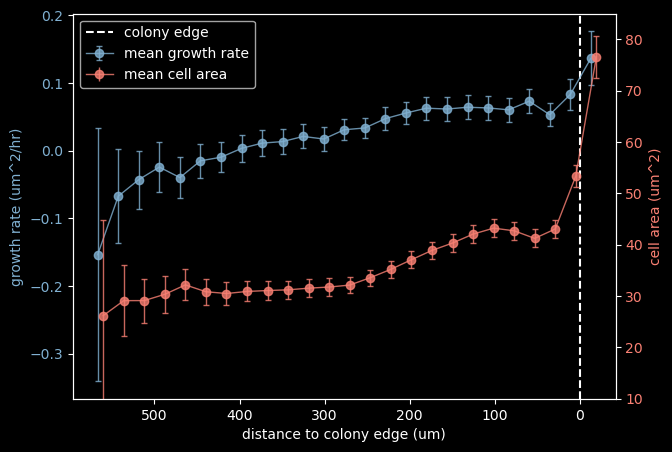

In [135]:
y_axis='smoothed_growth'

fig, growthAx = plt.subplots(1,1,figsize=(7,5))
growthColor='C4'
v_mean, bins, bin_number = binned_statistic(t['edge_distance'], t[y_axis], bins=25, range=(-40,1832), statistic=np.nanmean)
v_std, bins, bin_number = binned_statistic(t['edge_distance'], t[y_axis], bins=bins, statistic=np.nanstd)
v_sem=v_std/np.sqrt(np.unique(bin_number, return_counts=True)[1][1:])
growthAx.errorbar(bins[:-1]*0.3225, v_mean*2*0.3225**2, yerr=v_sem, color=growthColor, fmt='o-', capsize=2, linewidth=1, alpha=0.8, label='mean growth rate')

growthAx.axvline(0, color='white', linestyle='--', label='colony edge', zorder=0)

growthAx.set_xlim(np.flip(plt.xlim()))
growthAx.set_ylabel('growth rate (um^2/hr)', color=growthColor)
growthAx.tick_params(axis='y', labelcolor=growthColor)

areaAx=growthAx.twinx()
areaColor='C3'
v_mean, bins, bin_number = binned_statistic(t['edge_distance'], t['area'], bins=25, range=(-60,1812), statistic=np.nanmean)
v_std, bins, bin_number = binned_statistic(t['edge_distance'], t['area'], bins=bins, statistic=np.nanstd)
areaAx.errorbar(bins[:-1]*0.3225, v_mean, yerr=v_sem*100, color=areaColor, fmt='o-', capsize=2, linewidth=1, alpha=0.8, label='mean cell area')
areaAx.set_ylim(10,85)
areaAx.tick_params(axis='y', labelcolor=areaColor)
areaAx.set_ylabel('cell area (um^2)', color=areaColor)

# placeholder error bar for legend
growthAx.errorbar([], [], yerr=[], color=areaColor, fmt='o-', capsize=2, linewidth=1, alpha=0.8, label='mean cell area')
growthAx.legend()
growthAx.set_xlabel('distance to colony edge (um)')

plt.savefig(f'plots/24-3-25 Supergroup/area_vs_edge_distance.png', dpi=300, bbox_inches='tight')

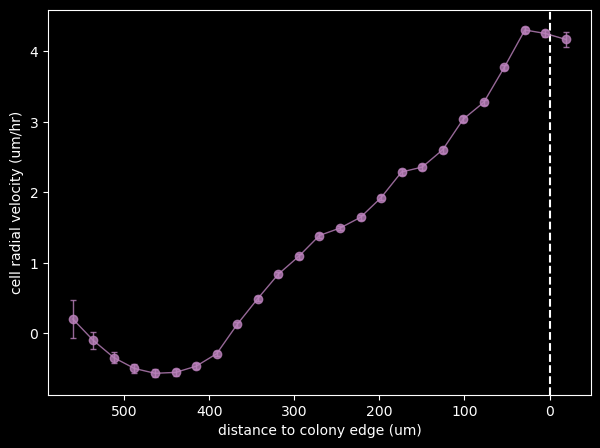

In [149]:
y_axis='v_r'

fig, growthAx = plt.subplots(1,1,figsize=(7,5))
growthColor='C7'
v_mean, bins, bin_number = binned_statistic(t['edge_distance'], t[y_axis], bins=25, range=(-60,1812), statistic=np.nanmean)
v_std, bins, bin_number = binned_statistic(t['edge_distance'], t[y_axis], bins=bins, statistic=np.nanstd)
v_sem=v_std/np.sqrt(np.unique(bin_number, return_counts=True)[1][1:])
growthAx.errorbar(bins[:-1]*0.3225, v_mean*2, yerr=v_sem*3, color=growthColor, fmt='o-', capsize=2, linewidth=1, alpha=0.8, label='mean growth rate')

growthAx.axvline(0, color='white', linestyle='--', label='colony edge', zorder=0)

growthAx.set_xlim(np.flip(plt.xlim()))
growthAx.set_ylabel('cell radial velocity (um/hr)')
growthAx.set_xlabel('distance to colony edge (um)')

plt.savefig(f'plots/24-3-25 Supergroup/radial velocity_vs_edge_distance.png', dpi=300, bbox_inches='tight')

  0%|          | 0/36 [00:00<?, ?it/s]

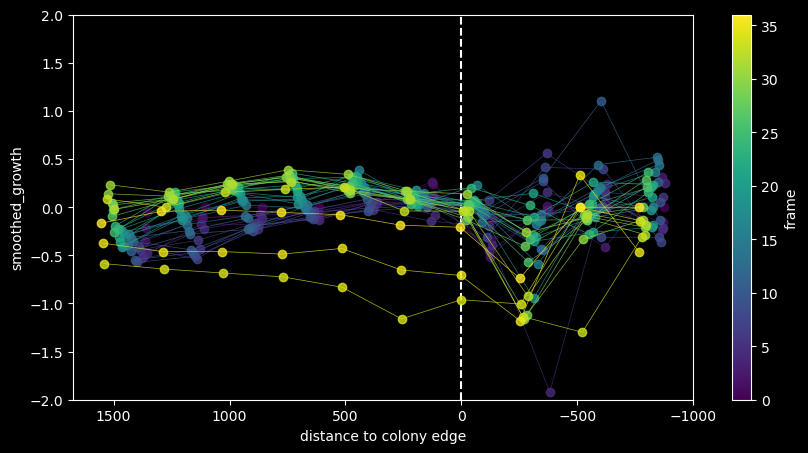

In [430]:
colors=plt.cm.viridis(np.linspace(0, 1, len(t['frame'].unique())))

y_axis='smoothed_growth'

plt.figure(figsize=(10, 5))
for (frame_number, t_frame), color in zip(tqdm(t.groupby('frame')), colors):
    #plt.scatter(t_frame['edge_distance'], t_frame[y_axis], s=1, alpha=0.5, color=color, label=frame_number)
    v_mean, bins, bin_number = binned_statistic(t_frame['edge_distance'], t_frame[y_axis], bins=10, statistic=np.nanmean)
    v_std, bins, bin_number = binned_statistic(t_frame['edge_distance'], t_frame[y_axis], bins=bins, statistic=np.nanstd)
    v_sem=v_std/np.sqrt(np.unique(bin_number, return_counts=True)[1])
    plt.errorbar(bins[:-1], v_mean, label=frame_number, fmt='o-', color=color, capsize=2, linewidth=0.5, alpha=0.8)

plt.axvline(0, color='white', linestyle='--')

plt.xlim(np.flip(plt.xlim()))
plt.ylim(-2,2)
plt.ylabel(y_axis)
plt.xlabel('distance to colony edge')

# colorbar
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=plt.Normalize(vmin=0, vmax=len(t['frame'].unique())))
plt.colorbar(sm, label='frame', ax=plt.gca())

plt.savefig(f'plots/expanding_colony/{y_axis}_vs_edge_distance.png', dpi=300, bbox_inches='tight')

In [371]:
long_tracks=np.where(t.groupby('particle').size()>20)[0]

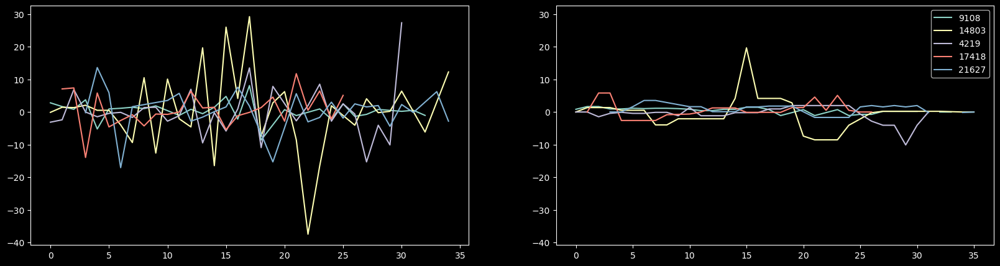

In [402]:
from scipy.signal import medfilt
fig, axes=plt.subplots(1,2,figsize=(20, 5))

for particle in np.random.choice(long_tracks, 5, replace=False):
    axes[0].plot(t[t.particle==particle]['frame'], t[t.particle==particle]['growth_rate'], label=particle)
    smoothed_growth=medfilt(t[t.particle==particle]['growth_rate'], 5)
    axes[1].plot(t[t.particle==particle]['frame'], smoothed_growth, label=particle)
    axes[1].set_ylim(axes[0].get_ylim())

plt.legend()

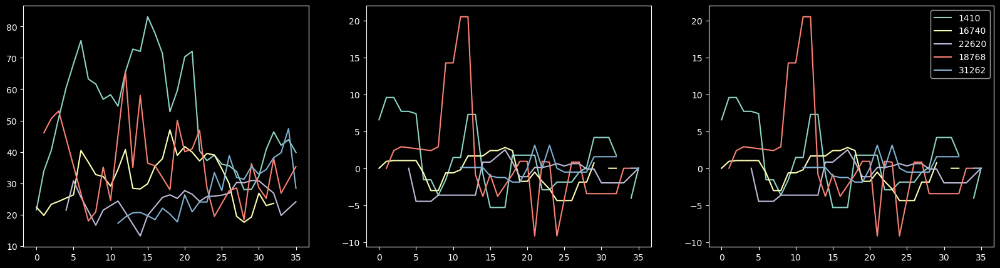

In [414]:
fig, axes=plt.subplots(1,3,figsize=(20, 5))

for particle in np.random.choice(long_tracks, 5, replace=False):
    axes[0].plot(t[t.particle==particle]['frame'], t[t.particle==particle]['area'], label=particle)
    #axes[1].plot(t[t.particle==particle]['frame'], t[t.particle==particle]['growth_rate'], label=particle)
    smoothed_growth=medfilt(t[t.particle==particle]['growth_rate'], 5)
    axes[1].plot(t[t.particle==particle]['frame'], smoothed_growth, label=particle)
    axes[2].plot(t[t.particle==particle]['frame'], t[t.particle==particle]['smoothed_growth'], label=particle)

plt.legend()

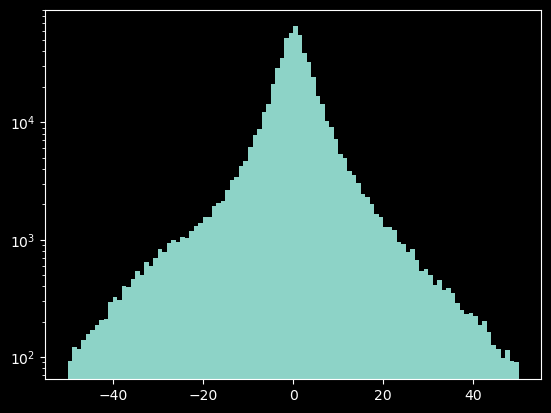

In [396]:
plt.hist(t['growth_rate'], bins=100, range=(-50,50))
plt.yscale('log')

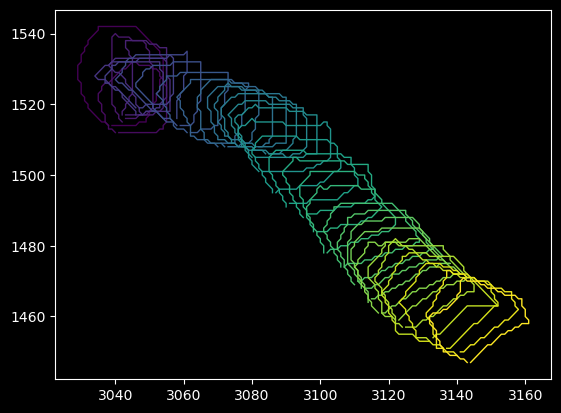

In [392]:
particle=stack.get_particle(6029)
colors=plt.cm.viridis(np.linspace(0, 1, len(particle)))
for cell, color in zip(particle, colors):
    plt.plot(*cell.outline.T, color=color, linewidth=1)

## FUCCI analysis

In [5]:
stack.load_img()

In [18]:
def get_FUCCI(frame, bg_threshold=0.97, nuclear_fraction=0.15):
    colony_mask=get_colony_mask(frame.masks, close_iter=100, open_iter=1)

    f_quantile=lambda x: np.quantile(x, 1-nuclear_fraction)
    null_red, null_green=[np.quantile(img_channel[~colony_mask], bg_threshold) for img_channel in [frame.img[...,0], frame.img[...,1]]]
    red_percentiles, green_percentiles=[ndimage.labeled_comprehension(img_channel, frame.masks, 
                                                                    index=np.arange(frame.n)+1, func=f_quantile, 
                                                                    out_dtype=float, default=0) for img_channel in [frame.img[...,0], frame.img[...,1]]]
    for cell, red, green in zip(frame.cells, red_percentiles, green_percentiles):
        cell.red=red>null_red
        cell.green=green>null_green

In [15]:
for frame in tqdm(stack.frames):
    get_FUCCI(frame)

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/16837 [00:00<?, ?it/s]

  0%|          | 0/16851 [00:00<?, ?it/s]

  0%|          | 0/16822 [00:00<?, ?it/s]

  0%|          | 0/17016 [00:00<?, ?it/s]

  0%|          | 0/17872 [00:00<?, ?it/s]

  0%|          | 0/17264 [00:00<?, ?it/s]

  0%|          | 0/17342 [00:00<?, ?it/s]

  0%|          | 0/17435 [00:00<?, ?it/s]

  0%|          | 0/17857 [00:00<?, ?it/s]

  0%|          | 0/18414 [00:00<?, ?it/s]

  0%|          | 0/18489 [00:00<?, ?it/s]

  0%|          | 0/18645 [00:00<?, ?it/s]

  0%|          | 0/18836 [00:00<?, ?it/s]

  0%|          | 0/18856 [00:00<?, ?it/s]

  0%|          | 0/19457 [00:00<?, ?it/s]

  0%|          | 0/18871 [00:00<?, ?it/s]

  0%|          | 0/18960 [00:00<?, ?it/s]

  0%|          | 0/19012 [00:00<?, ?it/s]

  0%|          | 0/19008 [00:00<?, ?it/s]

  0%|          | 0/19192 [00:00<?, ?it/s]

  0%|          | 0/19406 [00:00<?, ?it/s]

  0%|          | 0/19890 [00:00<?, ?it/s]

  0%|          | 0/19407 [00:00<?, ?it/s]

  0%|          | 0/19294 [00:00<?, ?it/s]

  0%|          | 0/19174 [00:00<?, ?it/s]

  0%|          | 0/19193 [00:00<?, ?it/s]

  0%|          | 0/19243 [00:00<?, ?it/s]

  0%|          | 0/18910 [00:00<?, ?it/s]

  0%|          | 0/19605 [00:00<?, ?it/s]

  0%|          | 0/18960 [00:00<?, ?it/s]

  0%|          | 0/19111 [00:00<?, ?it/s]

  0%|          | 0/19389 [00:00<?, ?it/s]

  0%|          | 0/18459 [00:00<?, ?it/s]

  0%|          | 0/18242 [00:00<?, ?it/s]

  0%|          | 0/18213 [00:00<?, ?it/s]

  0%|          | 0/18159 [00:00<?, ?it/s]

In [16]:
def impute_fill(cell_cycle, limit=6):
    cell_cycle=cell_cycle.replace(0,np.nan).ffill(limit=limit)
    cell_cycle=cell_cycle.bfill(limit=limit).fillna(0).astype(int)
    return cell_cycle

def smooth_small_flickers(cell_cycle):
    oneHot_cc=pd.get_dummies(cell_cycle)
    smoothed_cc=np.nansum([oneHot_cc.shift(-1), oneHot_cc, oneHot_cc.shift(1)], axis=0)/3
    smoothed_cc[[0,-1]]*=3/2
    cell_cycle=oneHot_cc.columns[np.argmax(smoothed_cc, axis=1)]
    return pd.Series(cell_cycle)

def get_transitions(cell_cycle):
    is_transition=[True,*(np.diff(cell_cycle)!=0)]
    stages=cell_cycle.reset_index(drop=True)[is_transition]
    stage_lengths=cell_cycle.groupby(np.cumsum(is_transition)).size()
    return stages, stage_lengths

def correct_mother_G2(cell_cycle):
    stages, stage_lengths=get_transitions(cell_cycle)
    if np.array_equal(stages[-2:], [3,2]):
        last_stage_length=stage_lengths.iloc[-1]
        if last_stage_length<=6: # if it's red for longer than an hour, probably not a mitosis thing
            cell_cycle[-last_stage_length:]=3 # correct to G2
    return cell_cycle

def correct_daughter_G1(cell_cycle):
    stages, stage_lengths=get_transitions(cell_cycle.replace(2,3)) # get transitions, with S and G2 grouped into one stage
    if np.array_equal(stages[:2], [3,1]): # check for transitions from S/G2 -> G1 immediately after cell shows up
        first_stage_length=stage_lengths.iloc[0]
        if first_stage_length>=4: # if it's red for longer than an hour, probably not a mitosis thing
            cell_cycle[:first_stage_length]=1 # correct to G2
    return cell_cycle

def subsequence(seq, subseq):
    '''Returns list of indices where the subsequence is found in the sequence (indexed first element). If not found, returns an empty list.'''
    seq_length=len(seq)
    subseq_length=len(subseq)
    return np.array([x for x in range(seq_length-subseq_length+1) if np.array_equal(seq[x:x+len(subseq)], subseq)])
    
def remove_sandwich_flicker(cell_cycle, transition):
    corrected=False
    stages, stage_lengths=get_transitions(cell_cycle)
    flickers=subsequence(stages, transition)

    for flicker in flickers:
        outer_length=stage_lengths.iloc[[flicker,flicker+2]].sum()
        inner_length=stage_lengths.iloc[flicker+1]
        if outer_length>inner_length:
            false_start, false_end=stages.index[flicker+1:flicker+3]
            cell_cycle[false_start:false_end]=transition[-1] # correct to outer value
            corrected=True

    if corrected: # made a correction, should check if there's something new that can be fixed
        cell_cycle=remove_sandwich_flicker(cell_cycle, transition)

    return cell_cycle

# find FUCCI info that doesn't make sense over time
def get_problematic_IDs(trajectories):
    problematic_IDs=[]
    for particle_ID, cc_stage in trajectories.groupby('particle')['cell_cycle']:
        cc_transitions=np.diff(cc_stage)
        if np.any(~((cc_transitions==0)|(cc_transitions==1))): # a transition that's not G1->S or S->G2
            problematic_IDs.append(particle_ID)

    return(problematic_IDs)

def fetch_cell_cycle(frame):
    cc_stage=np.array([[cell.green, cell.red, cell.orange] for cell in frame.cells])
    cc_number=np.argmax(cc_stage, axis=1)+1
    cc_number[np.all(~cc_stage, axis=1)]=0
    
    return cc_number

def write_cell_cycle(frame, cell_cycle_stages):
    oneHot_cc=np.zeros((len(cell_cycle_stages),4), dtype=bool)
    oneHot_cc[np.arange(len(cell_cycle_stages)),cell_cycle_stages]=True
    for cell, cc_stage in zip(frame.cells, oneHot_cc[:,1:]):
        cell.green,cell.red,cell.orange=cc_stage

def get_interpretable_FUCCI(stack):
    t=stack.track_centroids(filter_stubs=False).sort_values(['frame', 'cell_number'])
    t['cell_cycle']=np.concatenate([fetch_cell_cycle(frame) for frame in stack.frames])

    for ID in get_problematic_IDs(t): 
        cell_cycle=t.loc[t.particle==ID,'cell_cycle'].copy()

        # simple fix: extend existing data into any zero regions
        cell_cycle=impute_fill(cell_cycle, limit=6)
        
        # simple fix: smooth single-frame flickers by neighbor values
        cell_cycle=smooth_small_flickers(cell_cycle)

        # manual check: if a cell briefly goes red after G2 and then vanishes, it's just a byproduct of changes before mitosis
        cell_cycle=correct_mother_G2(cell_cycle)

        # manual check: similarly, if a cell starts out orange or red and then goes green, it's just vestigial fluorescence from mitosis.
        cell_cycle=correct_daughter_G1(cell_cycle)
        
        # manual check: if a cell goes from one phase to another and back, it's probably spurious (especially if out of temporal order).
        # the order of these checks matters (especially 3,2,3 then 2,3,2) because lots of cells will flicker and which check goes first determines who wins. Sorted by descending observed frequency
        cell_cycle=remove_sandwich_flicker(cell_cycle, [1,3,1]) # G1 jumps to G2
        cell_cycle=remove_sandwich_flicker(cell_cycle, [3,2,3]) # G2 back to S. This happens all the time because green creeps into red
        cell_cycle=remove_sandwich_flicker(cell_cycle, [1,3,2]) # G1 to S *through* G2. This is also likely because red replaces green
        cell_cycle=remove_sandwich_flicker(cell_cycle, [1,0,2]) # G1 to S through NS. This is also likely because red replaces green

        cell_cycle=remove_sandwich_flicker(cell_cycle, [2,3,2])

        t.loc[t.particle==ID,'cell_cycle']=np.array(cell_cycle)

    for ID in get_problematic_IDs(t):
        t.loc[t.particle==ID,'cell_cycle']=0 # remove any FUCCI data that still doesn't make sense

    for frame_number, cell_cycle_stages in t.groupby('frame')['cell_cycle']:
        write_cell_cycle(stack.frames[frame_number], cell_cycle_stages)

    stack.tracked_centroids['cell_cycle']=t['cell_cycle'] # also export cell cycle info to tracking
        
    return t

In [17]:
get_interpretable_FUCCI(stack)

AttributeError: 'Cell' object has no attribute 'orange'

In [ ]:
stack.tracked_centroids

(1500.0, 1000.0)

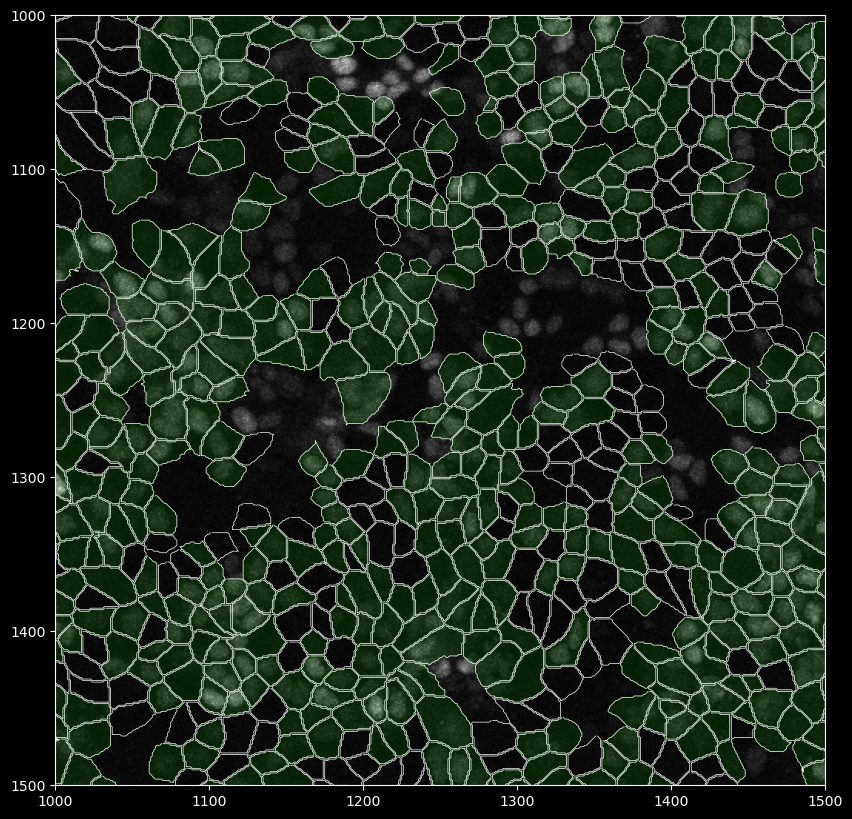

In [13]:
plt.figure(figsize=(10,10))
plt.imshow(frame.img[...,1], cmap='gray')

limits=(1000,1500)
cell_list=np.unique(frame.masks[limits[0]:limits[1],limits[0]:limits[1]])[1:]-1

for cell in frame.cells[cell_list]:
    plt.plot(*cell.outline.T, color='white', linewidth=0.5)
    if cell.green:
        plt.fill(*cell.outline.T, color='lime', alpha=0.1)

plt.xlim(limits[0],limits[1])
plt.ylim(limits[1],limits[0])

# slice

In [ ]:
stack=Stack(r'F:\Heather\FUCCI\20240301 FUCCI colony\slice\segmented/')

## find the leading edge

In [53]:
def get_frame_edge(frame, edge_quantile=0.95):
    masks=frame.masks[:,::-1]
    is_colony=ndimage.binary_fill_holes(masks!=0)
    mask_x=np.where(is_colony)[1]
    return np.quantile(mask_x, edge_quantile)

In [54]:
for frame in stack.frames:
    frame.edge=get_frame_edge(frame)

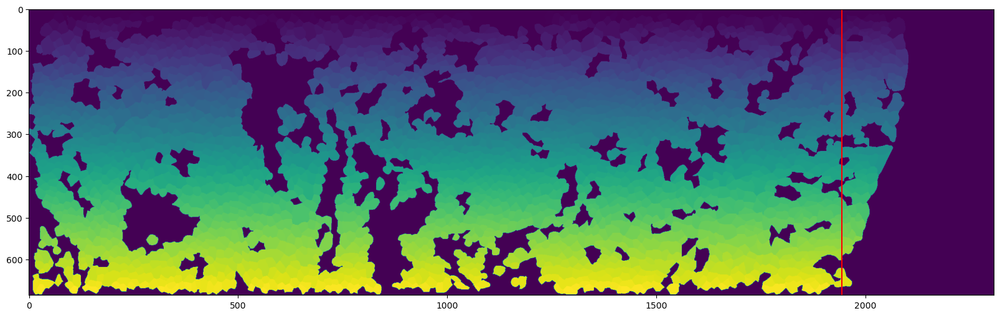

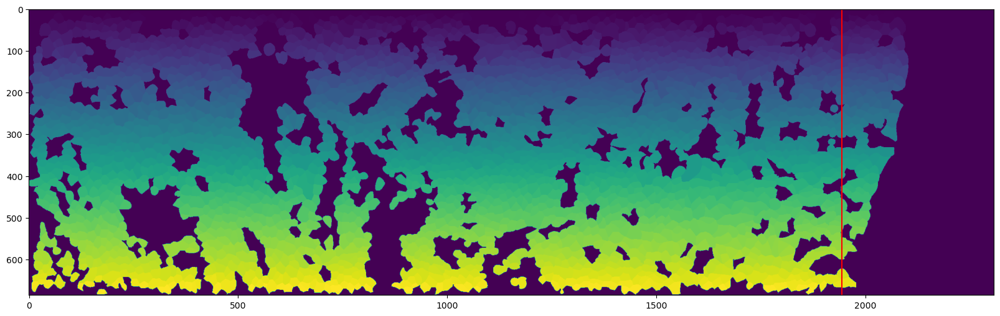

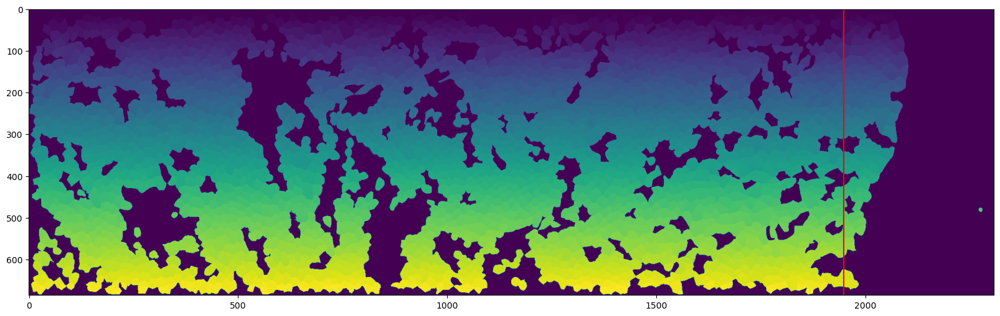

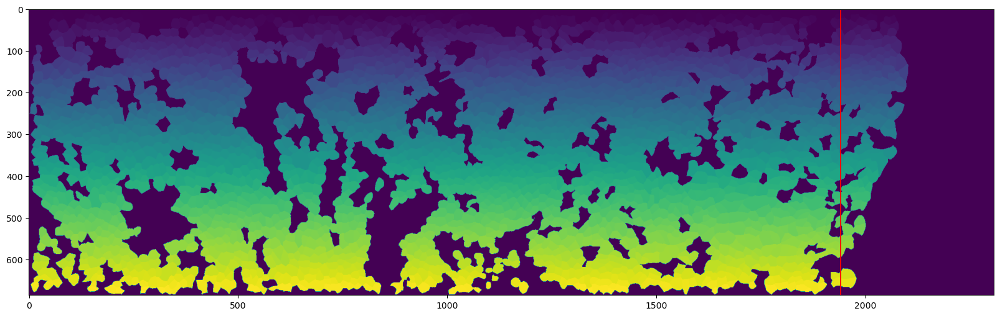

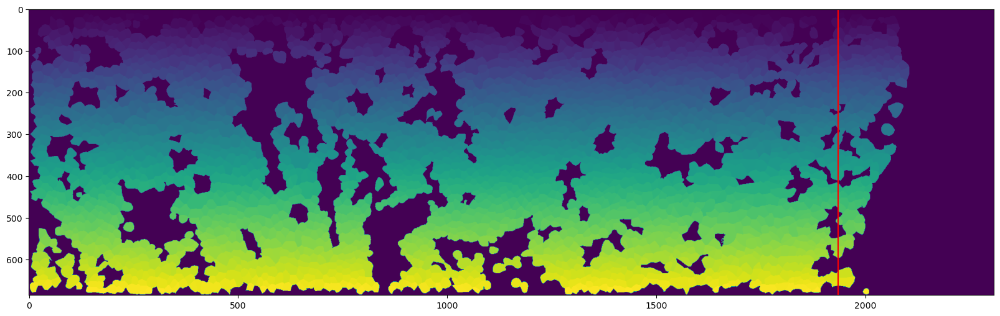

...

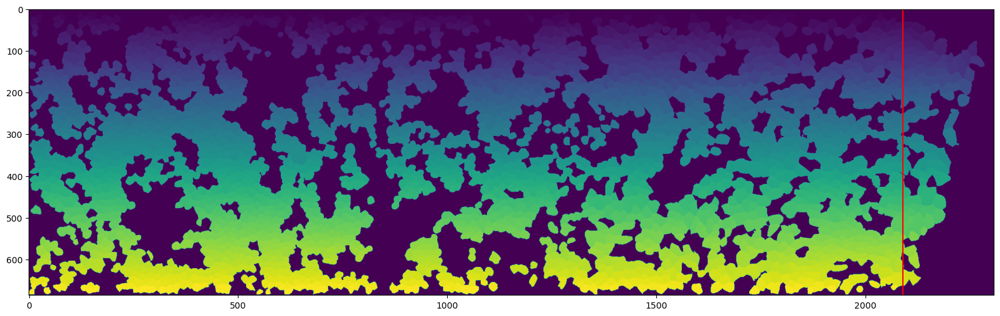

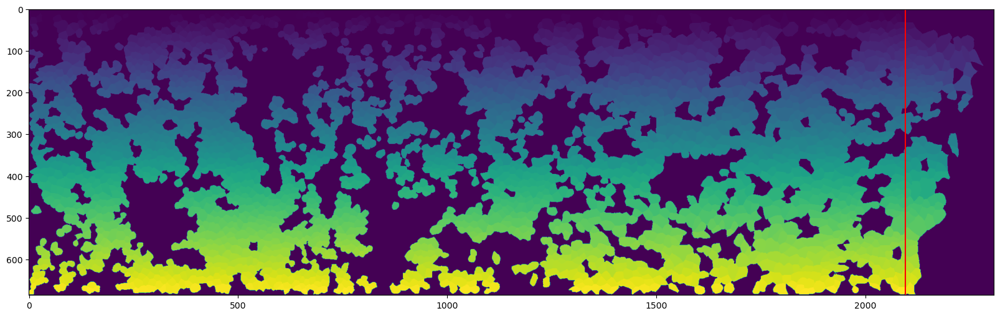

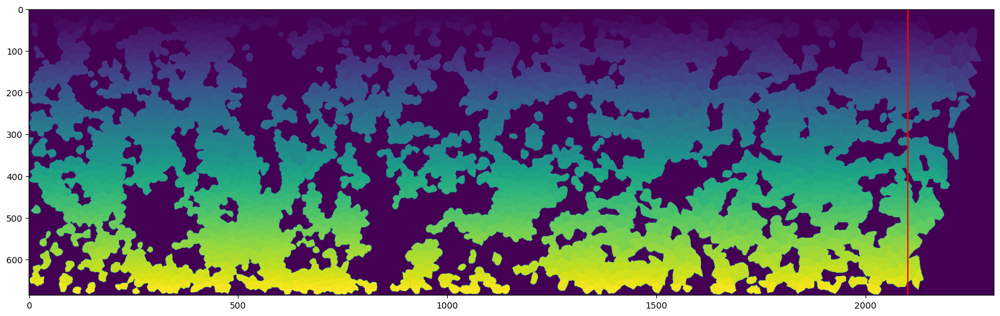

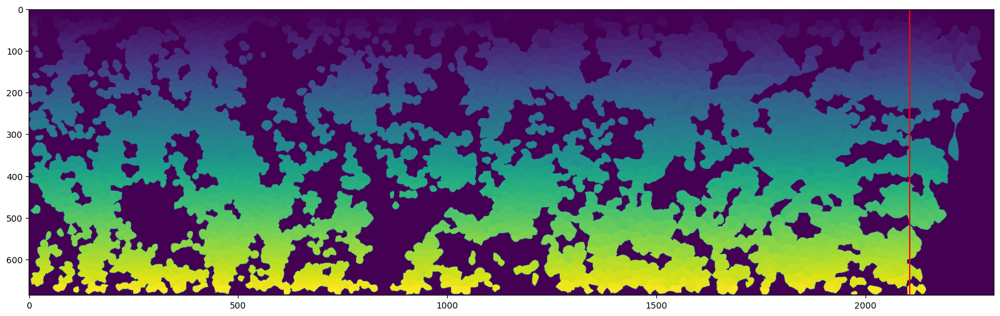

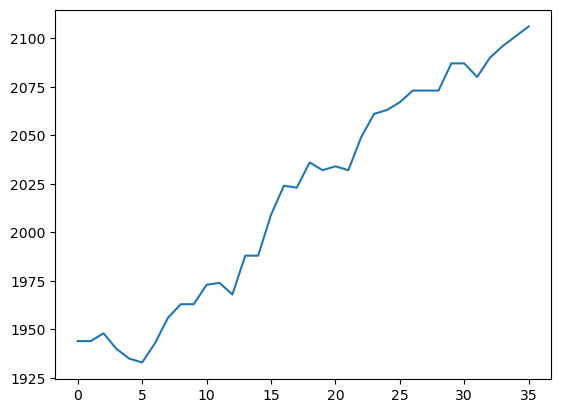

In [52]:
from scipy import ndimage
edge=[]
for frame in stack.frames:
    plt.figure(figsize=(20,7))
    masks=frame.masks[:,::-1]
    is_colony=ndimage.binary_fill_holes(masks!=0)
    mask_x=np.where(is_colony)[1]
    edge.append(np.quantile(mask_x, 0.95))
    plt.imshow(masks)
    plt.axvline(edge[-1], color='r')
    plt.show()

plt.plot(edge)
plt.show()

## velocity vs. distance

In [56]:
stack.velocities

,cell_number,y,x,frame,particle,dx,dy,dt,v,theta
0,0,16.140655,250.448940,0,0,5.282277,3.214101,1.0,6.183276,0.546623
2582,12,19.354756,255.731217,1,0,-1.069258,3.787389,2.0,3.935432,1.845956
7986,66,26.929533,253.592701,3,0,NaN,NaN,NaN,NaN,NaN
1,1,11.976744,312.761628,0,1,-0.354367,-1.476129,2.0,1.518069,-1.806403
5209,0,9.024485,312.052893,2,1,-2.350588,-0.842548,2.0,2.497028,-2.797417
...,...,...,...,...,...,...,...,...,...,...
102949,2600,626.200016,747.242708,34,6711,-1.179752,3.018884,1.0,3.241215,1.943339
105495,2612,629.218899,746.062956,35,6711,NaN,NaN,NaN,NaN,NaN
100320,2644,625.989922,198.689500,33,6712,-3.746460,4.914911,1.0,6.179993,2.222100
102965,2607,630.904833,194.943040,34,6712,2.235468,-1.245208,1.0,2.558879,-0.508219


In [22]:
mean_x_displacement=stack.velocities.groupby('particle').apply(lambda x: (x['x'].iloc[-1]-x['x'].iloc[0])/len(x))
mean_x=stack.velocities.groupby('particle')['x'].mean()

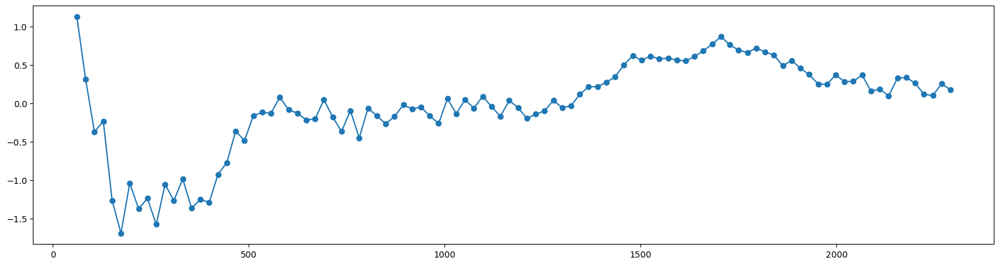

In [30]:
x_disp, bins, binnumber = binned_statistic(mean_x, mean_x_displacement, statistic=np.mean, bins=100)

plt.figure(figsize=(20,5))
plt.plot(bins[:-1], x_disp, 'o-')

(array([ 4.,  6.,  9., 17., 27., 36., 70., 74., 86., 82., 95., 90., 92.,
        94., 82., 85., 92., 80., 71., 83., 81., 86., 82., 90., 79., 74.,
        70., 66., 63., 72., 91., 63., 82., 79., 77., 90., 79., 71., 72.,
        81., 71., 62., 60., 77., 65., 64., 57., 62., 54., 56., 52., 82.,
        76., 59., 61., 56., 62., 70., 61., 56., 53., 60., 41., 45., 69.,
        77., 67., 76., 63., 72., 71., 61., 65., 59., 43., 56., 57., 66.,
        83., 82., 82., 74., 73., 68., 66., 50., 52., 55., 78., 75., 83.,
        76., 73., 69., 65., 69., 70., 69., 67., 47.]),
 array([  1.  ,   1.99,   2.98,   3.97,   4.96,   5.95,   6.94,   7.93,
          8.92,   9.91,  10.9 ,  11.89,  12.88,  13.87,  14.86,  15.85,
         16.84,  17.83,  18.82,  19.81,  20.8 ,  21.79,  22.78,  23.77,
         24.76,  25.75,  26.74,  27.73,  28.72,  29.71,  30.7 ,  31.69,
         32.68,  33.67,  34.66,  35.65,  36.64,  37.63,  38.62,  39.61,
         40.6 ,  41.59,  42.58,  43.57,  44.56,  45.55,  46.54,  47.53,
  

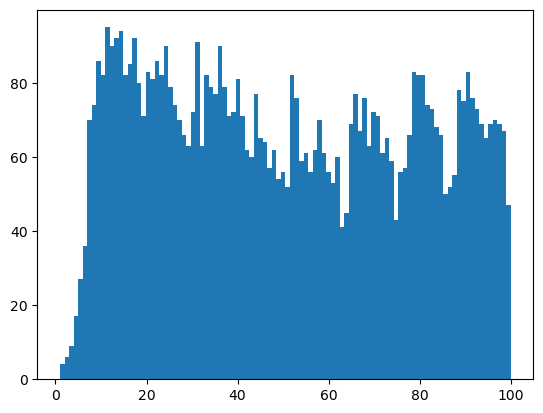

In [31]:
plt.hist(binnumber, bins=100)

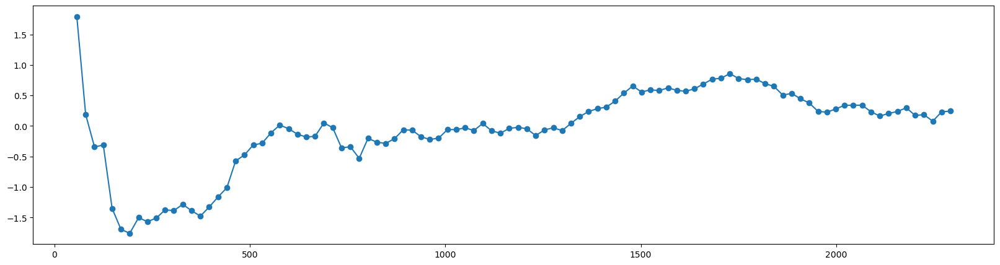

In [18]:
from scipy.stats import binned_statistic

dx, bins, _ = binned_statistic(stack.velocities['x'], stack.velocities['dx'], statistic=np.nanmean, bins=100)
plt.figure(figsize=(20,5))
plt.plot(bins[:-1], dx, 'o-')

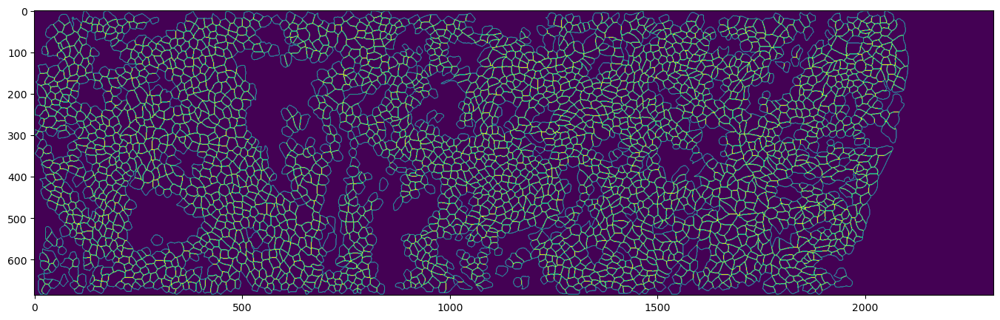

In [10]:
plt.figure(figsize=(20,5))
plt.imshow(stack.frames[0].outlines.todense()[:,::-1]!=0)

In [ ]:
stack.get_velocities()